In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import glob
from tqdm.auto import tqdm
pd.options.mode.chained_assignment = None  # default='warn'

/bsuhome/yavarpourmohamad/miniforge3/envs/ML/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
newCmapp = {
    'Power': '#a6cee3',
    'Equipment': '#1f78b4',
    'Recreation': '#b2df8a',
    'Debris': '#33a02c',
    'Arson': '#fb9a99',
    'Misuse by minor': '#e31a1c',
    'Natural': '#fdbf6f',
    'Firearms': '#ff7f00',
    'Fireworks': '#cab2d6',
    'Railroad': '#ffff99',
    'Smoking': '#b15928'
}
causes = ['Natural', 'Debris', 'Fireworks', 'Arson', 'Recreation', 'Smoking',
          'Equipment', 'Power', 'Misuse by minor', 'Firearms', 'Railroad']

# Ignition Load

In [3]:
nwcg = pd.read_csv(filepath_or_buffer = '/bsuhome/yavarpourmohamad/scratch/Dissertation/Code/Karen_email/NWCG_UnitIdActive_20200123.csv', sep = ',')
cols_FPA = ['STATE', 'FIRE_YEAR', 'DISCOVERY_DATE', 'NWCG_GENERAL_CAUSE', 'LONGITUDE', 'LATITUDE']
FPA_FOD = pd.read_csv(filepath_or_buffer = '/bsuhome/yavarpourmohamad/scratch/Dissertation/Data/FPA_FOD/FPA_FOD_Plus.csv',
                      sep = ',', low_memory = False)
sts = ['WA', 'OR', 'CA', 'ID', 'NV', 'MT', 'WY', 'UT', 'AZ', 'CO', 'NM']
sts.sort()
FPA_FOD = FPA_FOD.loc[FPA_FOD['STATE'].isin(sts)]
FPA_FOD = FPA_FOD.loc[FPA_FOD['LONGITUDE'] < -102.05]
FPA_FOD = pd.merge(left = FPA_FOD,
                   left_on = 'NWCG_REPORTING_UNIT_ID',
                   right = nwcg[['UnitId', 'UnitType']],
                   right_on = 'UnitId',
                   how = 'left')
FPA_FOD = FPA_FOD[~((FPA_FOD['FIRE_SIZE'] <= 0.1) & (FPA_FOD['Land_Cover'].isin([22, 23, 24])) & (FPA_FOD['UnitType'].isin(['US County/Local'])))]
FPA_FOD = FPA_FOD[cols_FPA]
cause_dic =  {'Debris and open burning': 'Debris',
              'Arson/incendiarism': 'Arson',
              'Recreation and ceremony': 'Recreation',
              'Missing data/not specified/undetermined': 'Missing',
              'Equipment and vehicle use': 'Equipment',
              'Power generation/transmission/distribution': 'Power',
              'Misuse of fire by a minor': 'Misuse by minor',
              'Firearms and explosives use': 'Firearms',
              'Railroad operations and maintenance': 'Railroad'}
FPA_FOD['NWCG_GENERAL_CAUSE'] = FPA_FOD['NWCG_GENERAL_CAUSE'].replace(cause_dic)              
FPA_FOD = FPA_FOD[~FPA_FOD['NWCG_GENERAL_CAUSE'].isin(['Other causes', 'Missing'])]
FPA_FOD = FPA_FOD.loc[FPA_FOD['FIRE_YEAR'] > 2015, ]
FPA_FOD['DISCOVERY_DATE'] = pd.to_datetime(FPA_FOD['DISCOVERY_DATE'])
FPA_FOD['month'] = FPA_FOD['DISCOVERY_DATE'].dt.strftime('%b')
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
FPA_FOD['month'] = pd.Categorical(FPA_FOD['month'], categories=month_order, ordered=True)

In [4]:
ingi_load = FPA_FOD.groupby(by=['STATE', 'FIRE_YEAR', 'month', 'NWCG_GENERAL_CAUSE']).size().reset_index(name='Counts')

/tmp/ipykernel_66912/924392500.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ingi_load = FPA_FOD.groupby(by=['STATE', 'FIRE_YEAR', 'month', 'NWCG_GENERAL_CAUSE']).size().reset_index(name='Counts')


# Potential Ignition Load

In [5]:
# csv_list = glob.glob(pathname='/bsuhome/yavarpourmohamad/scratch/Dissertation/Cause_specific/Time_series_grid/yearly/ts_data_cause*.csv')
# csv_list.sort()

In [6]:
# pot_igni_load = []
# for csv in tqdm(csv_list[:]):
#     temp = pd.read_csv(filepath_or_buffer=csv, sep=',', low_memory=False)
#     temp['date'] = pd.to_datetime(temp['date'])
#     temp['month'] = temp['date'].dt.strftime('%b')
#     temp = temp.groupby(by=['STATE', 'month'])[causes].sum().reset_index()
#     temp['FIRE_YEAR'] = int(''.join(c for c in csv if c.isdigit()))
#     temp = temp.melt(id_vars=['STATE', 'FIRE_YEAR', 'month'],
#                      var_name='NWCG_GENERAL_CAUSE',
#                      value_vars=causes,
#                      value_name='Counts')
#     temp = temp.groupby(by=['STATE', 'FIRE_YEAR', 'month', 'NWCG_GENERAL_CAUSE'])['Counts'].sum().reset_index()
#     pot_igni_load.append(temp)

In [7]:
# pot_igni_load = pd.concat(objs=pot_igni_load)
# pot_igni_load['month'] = pd.Categorical(pot_igni_load['month'], categories=month_order, ordered=True)

In [5]:
# pot_igni_load.to_csv(path_or_buf='/bsuhome/yavarpourmohamad/scratch/Dissertation/Cause_specific/Mapping/pot_igni_load.csv',
#                      sep=',', index=False)
pot_igni_load = pd.read_csv(filepath_or_buffer='/bsuhome/yavarpourmohamad/scratch/Dissertation/Cause_specific/Mapping/pot_igni_load.csv',
                            sep=',')
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
pot_igni_load['month'] = pd.Categorical(pot_igni_load['month'], categories=month_order, ordered=True)

# plotting

## line plots

In [6]:
ingi_load = ingi_load.sort_values(by=['STATE', 'FIRE_YEAR', 'month', 'NWCG_GENERAL_CAUSE']).reset_index(drop=True)
pot_igni_load = pot_igni_load.sort_values(by=['STATE', 'FIRE_YEAR', 'month', 'NWCG_GENERAL_CAUSE']).reset_index(drop=True)

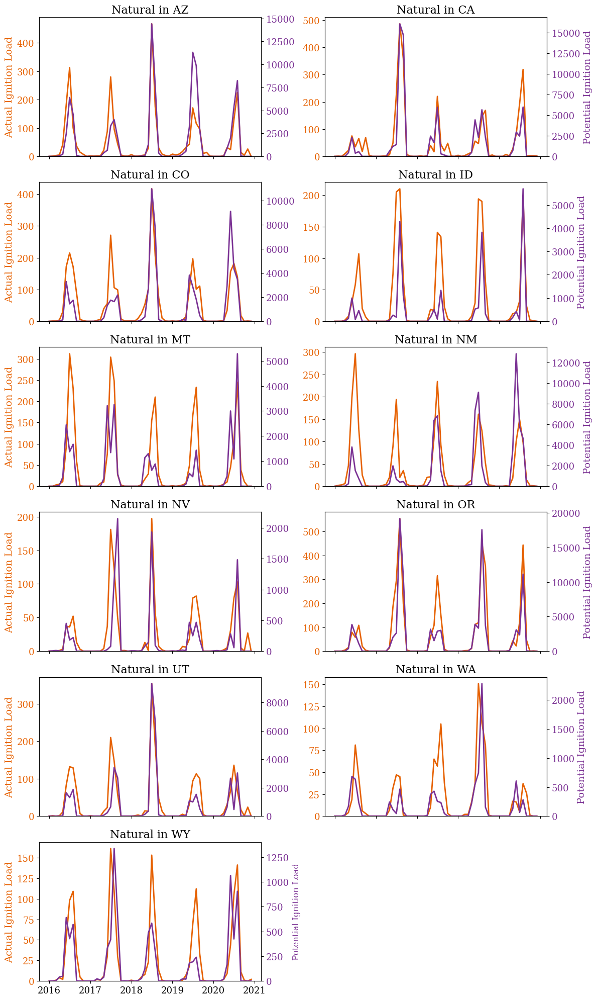

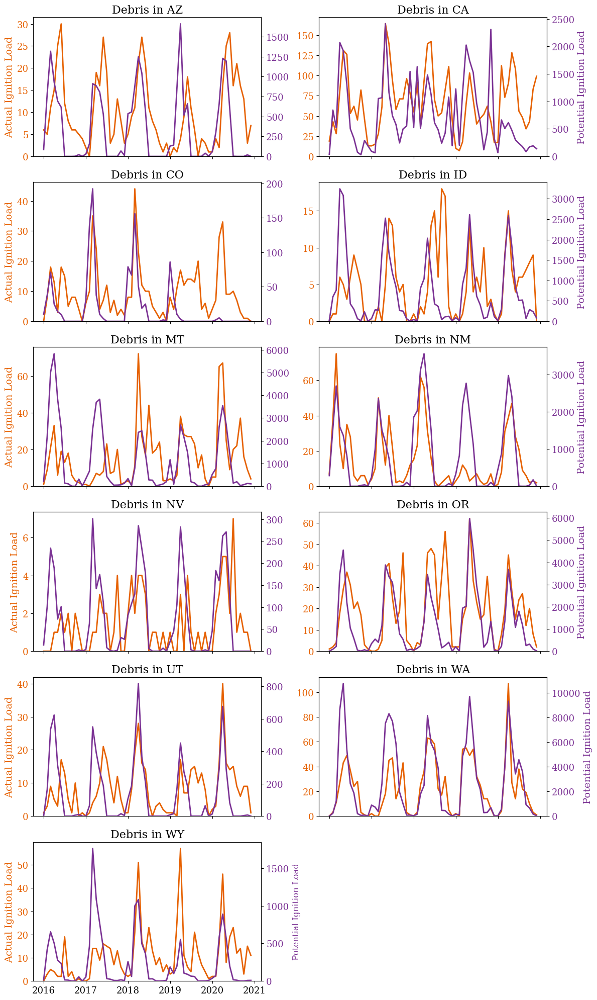

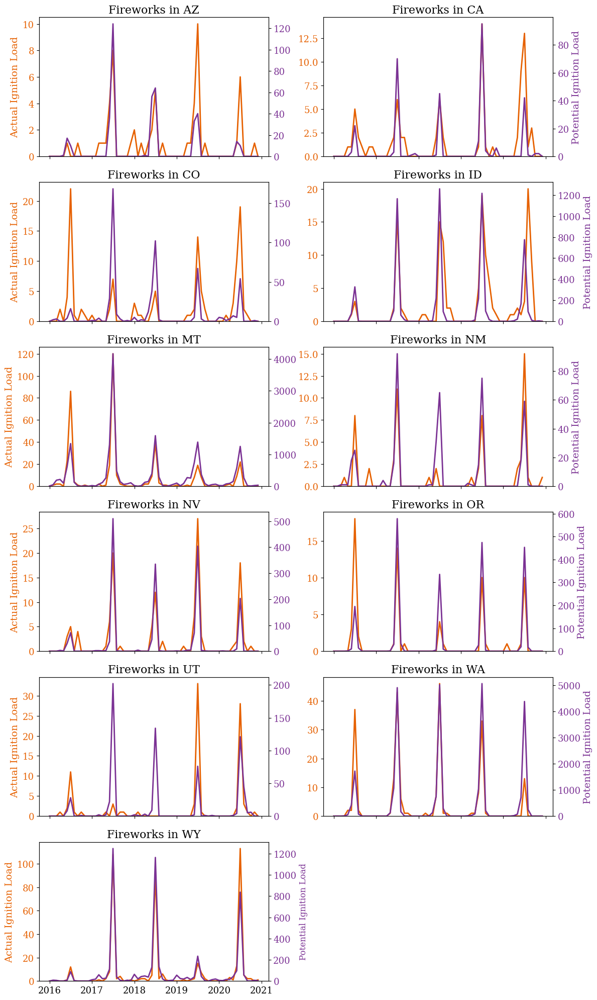

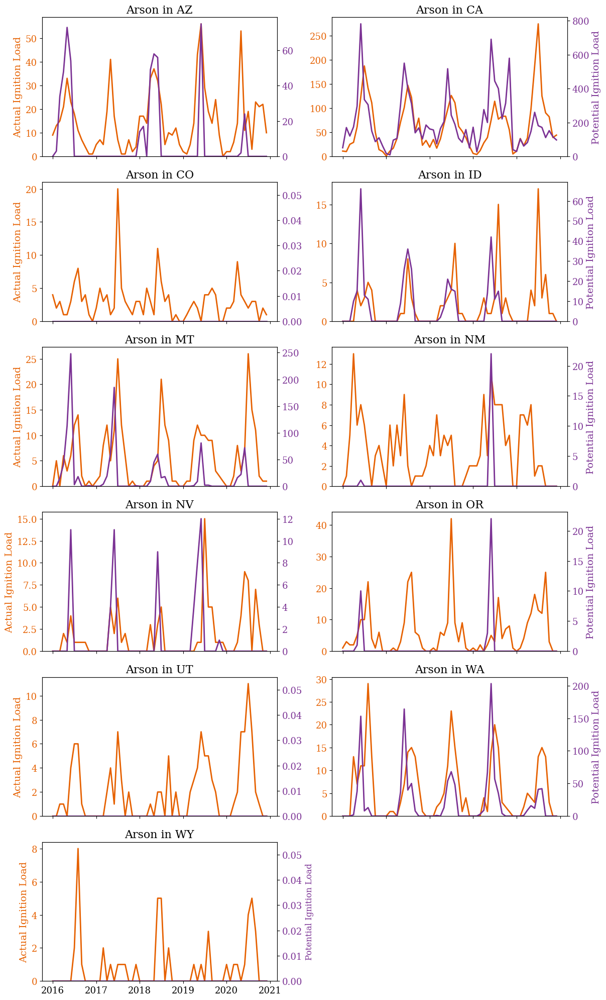

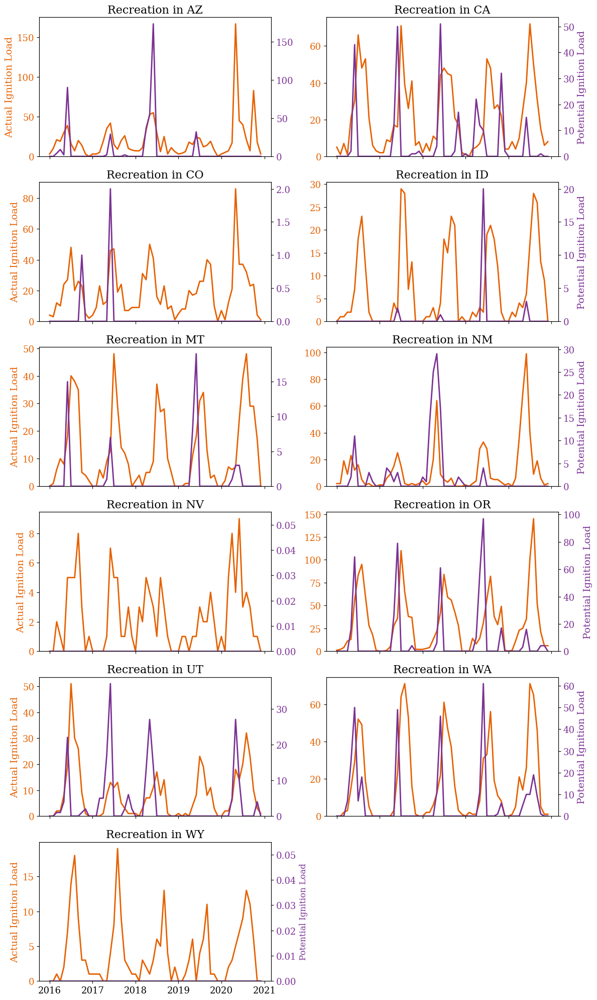

...

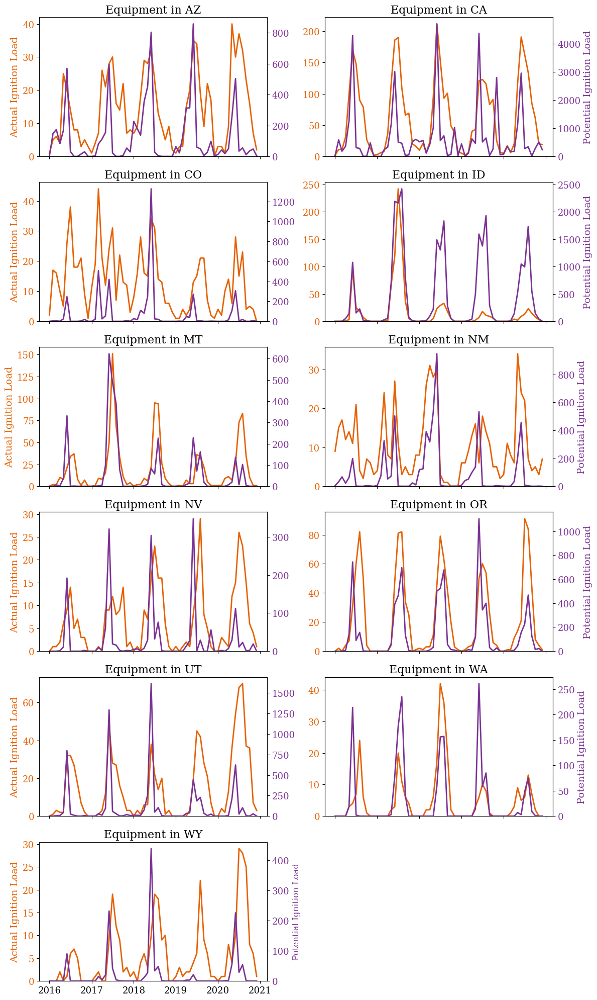

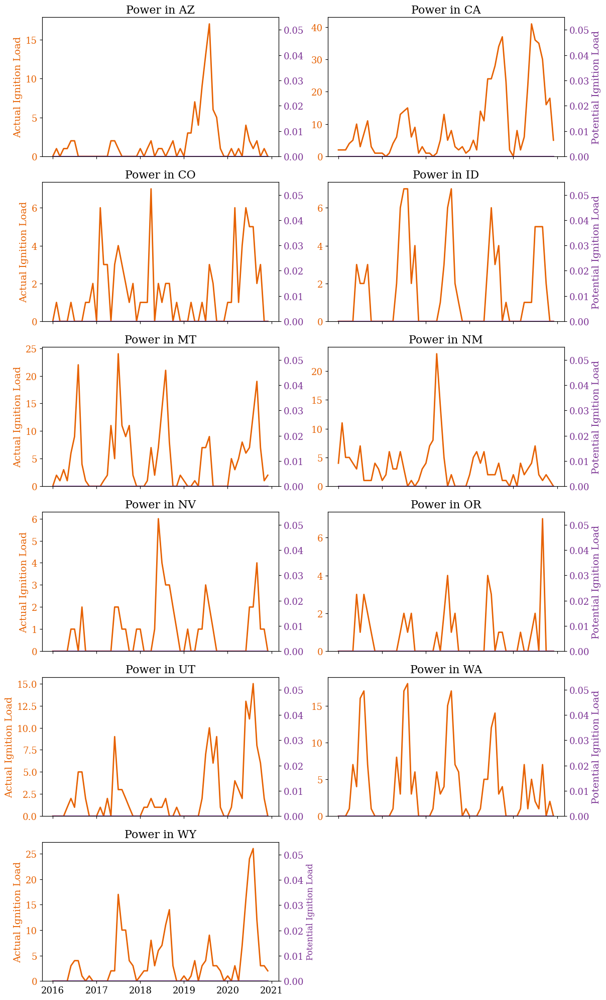

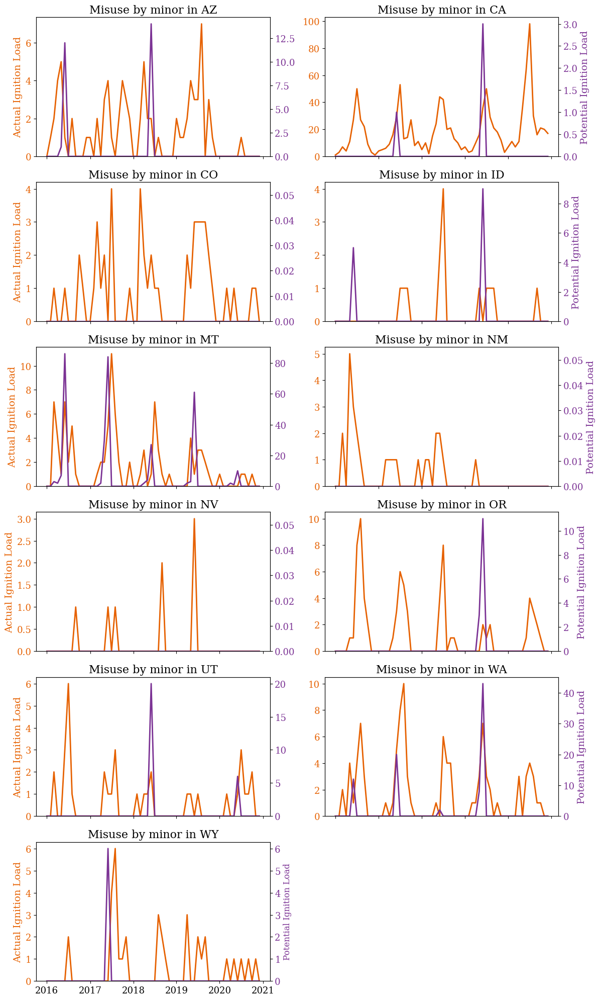

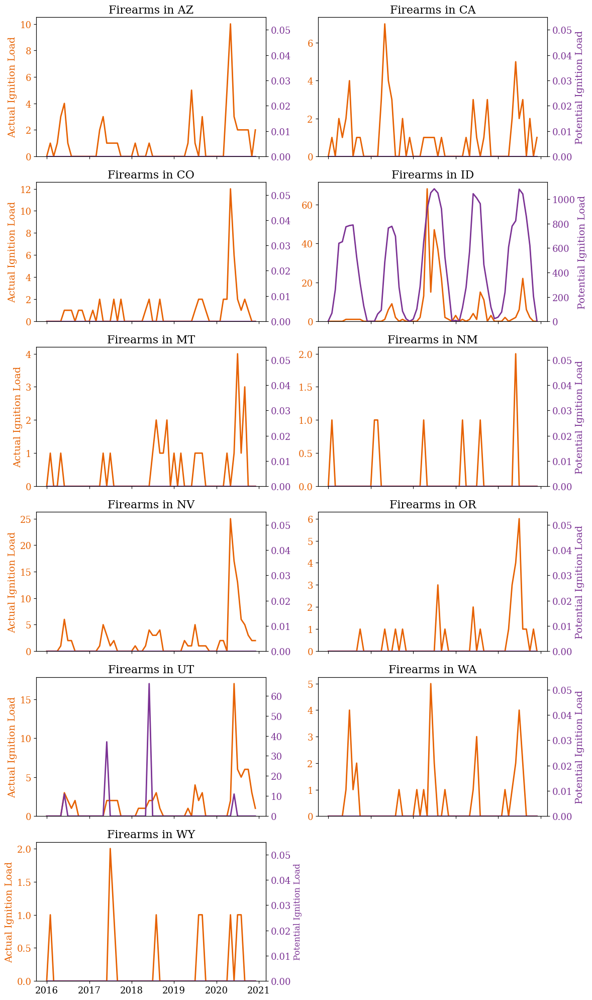

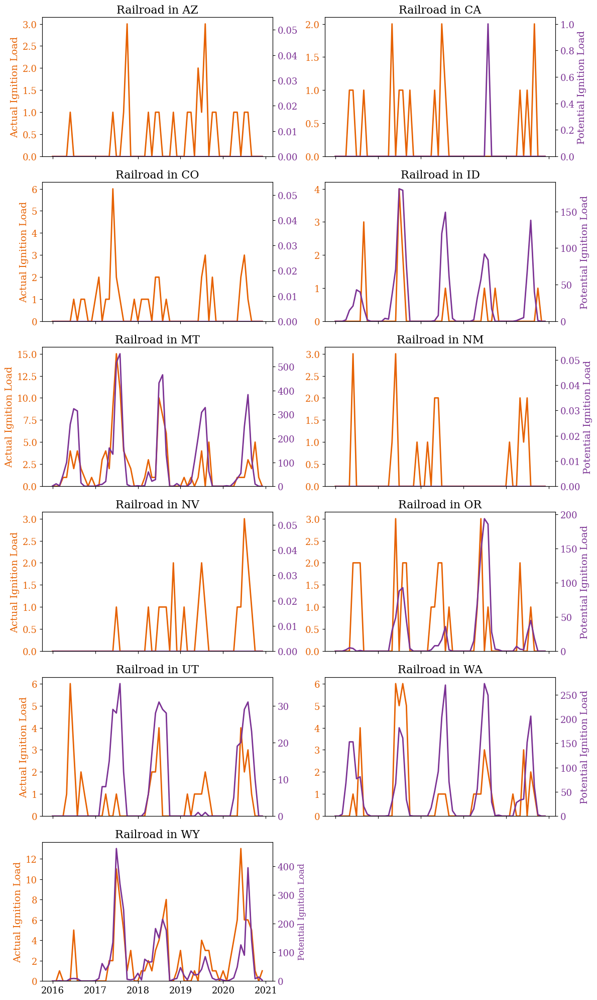

In [22]:
actual_color = '#e66101'
potential_color = '#7b3294'
for cause in causes[:]:
    fig, axes = plt.subplots(nrows=6, ncols=2, sharex=True, sharey=False, figsize=(12, 20))
    ax = axes.flatten()
    for i, st in enumerate(sts[:]):
        date_series = pot_igni_load.loc[(pot_igni_load['STATE'] == st) & (pot_igni_load['NWCG_GENERAL_CAUSE'] == cause), ['FIRE_YEAR', 'month']]
        date_series = date_series['FIRE_YEAR'].astype(str) + '-' + date_series['month'].astype(str) + '-' + '01'
        date_series = pd.to_datetime(date_series, format='%Y-%b-%d')
        actual = ingi_load.loc[(ingi_load['STATE'] == st) & (ingi_load['NWCG_GENERAL_CAUSE'] == cause), 'Counts']
        potential = pot_igni_load.loc[(pot_igni_load['STATE'] == st) & (pot_igni_load['NWCG_GENERAL_CAUSE'] == cause), 'Counts']

        ax[i].plot(date_series, actual, label='Ignition Load', color=actual_color, linewidth=2)
        ax[i].set_ylabel('Actual Ignition Load', color=actual_color, fontsize=14)
        ax[i].tick_params(axis='y', labelcolor=actual_color)

        ax2 = ax[i].twinx()
        ax2.plot(date_series, potential, label='Potential Ignition Load', color=potential_color, linewidth=2)
        ax2.set_ylabel('Potential Ignition Load', color=potential_color, fontsize=14)
        ax2.tick_params(axis='y', labelcolor=potential_color)
        ax[i].set_ylim(bottom=0)
        ax2.set_ylim(bottom=0)

        if i % 2 == 1:
            ax[i].set_ylabel('')
        else:
            ax2.set_ylabel('')
        
        if i == 10:
            ax2.set_ylabel('Potential Ignition Load', color=potential_color, fontsize=12)
        
        ax2.tick_params(axis = 'both', labelsize = 13)
        ax[i].tick_params(axis = 'both', labelsize = 13)
        ax[i].set_title(f'{cause} in {st}', fontsize=16)
        ax[i].set_xlabel('')
        ax[-1].axis('off')
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_66912/772790388.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  month_ingi_load = ingi_load.groupby(by=['STATE', 'month', 'NWCG_GENERAL_CAUSE'])['Counts'].sum().reset_index()
/tmp/ipykernel_66912/772790388.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  month_pot_igni_load = pot_igni_load.groupby(by=['STATE', 'month', 'NWCG_GENERAL_CAUSE'])['Counts'].sum().reset_index()


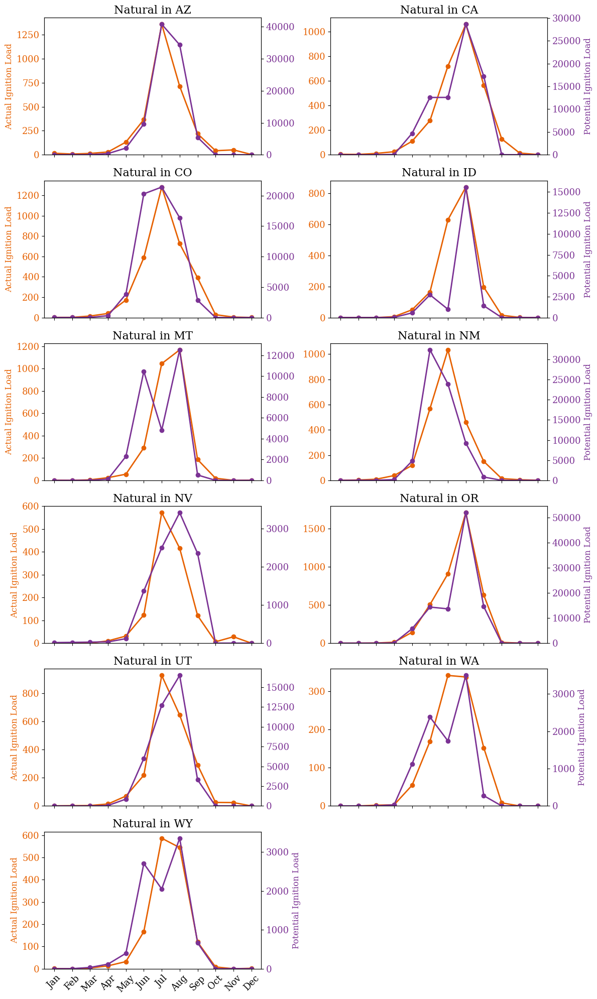

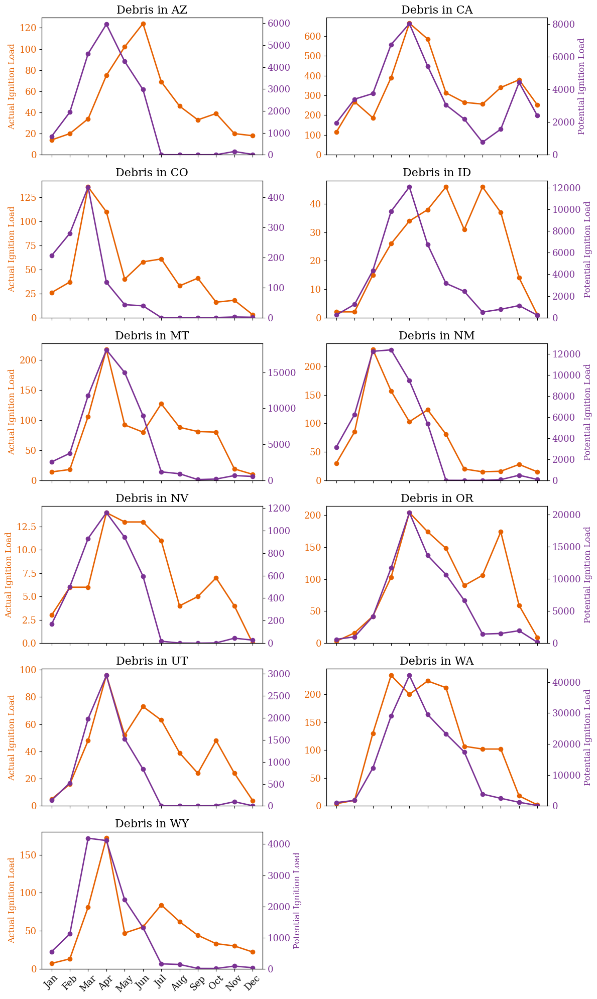

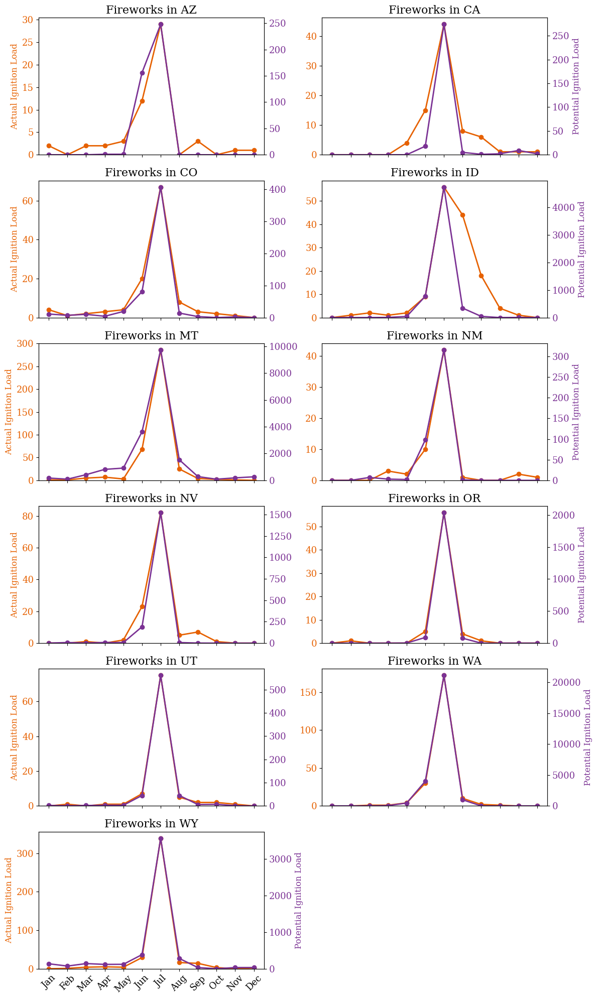

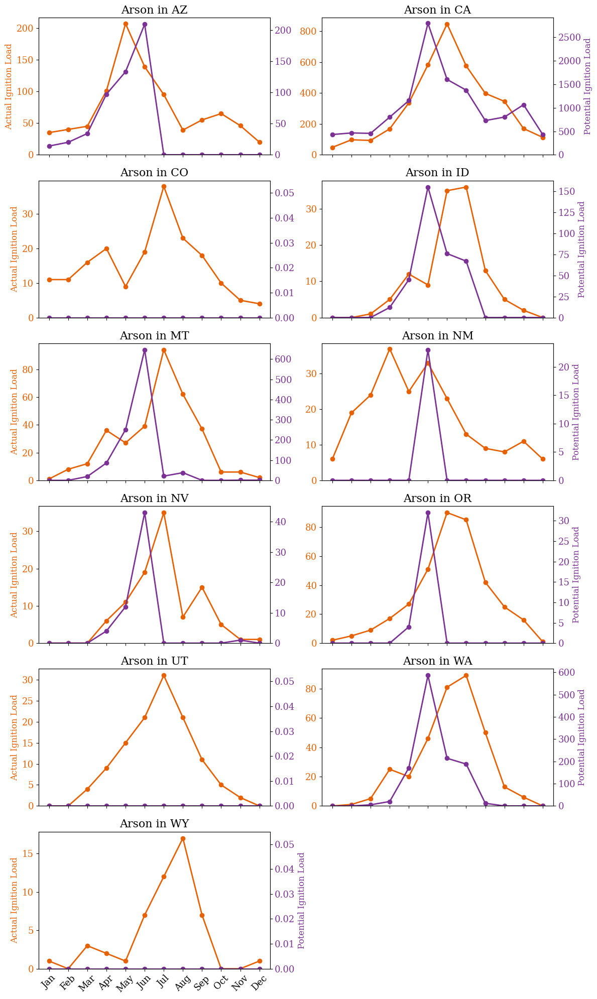

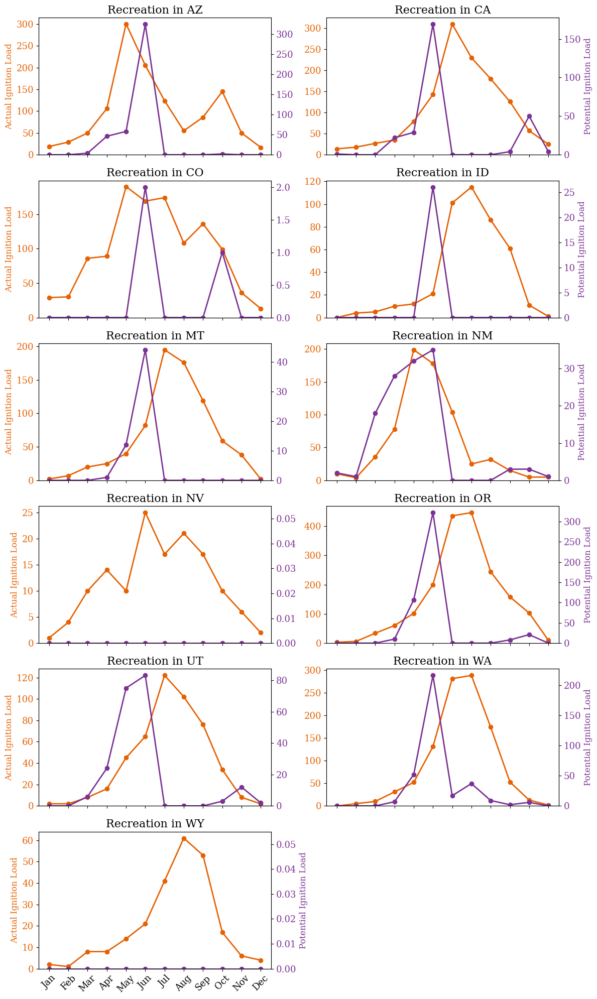

...

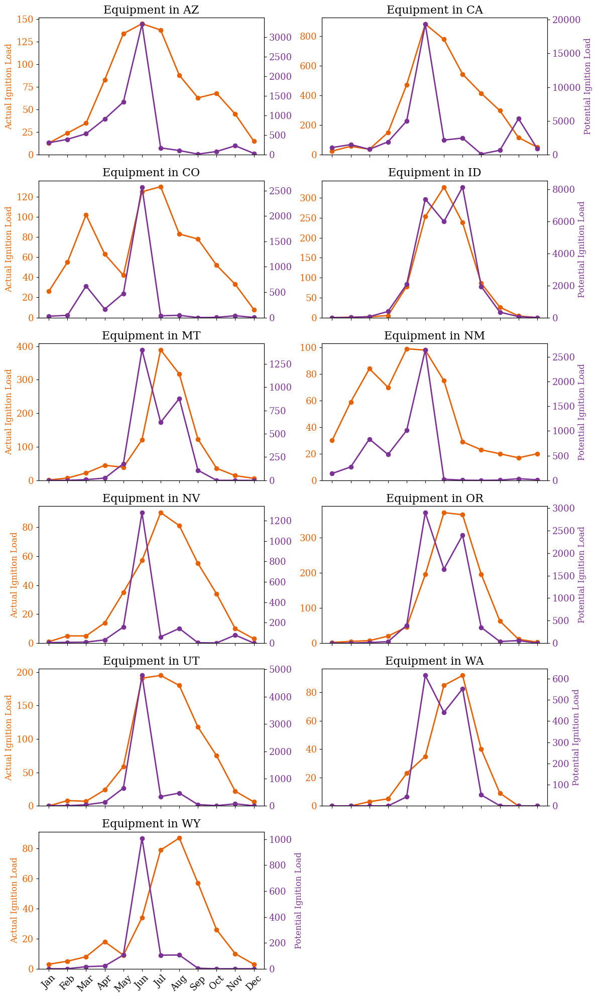

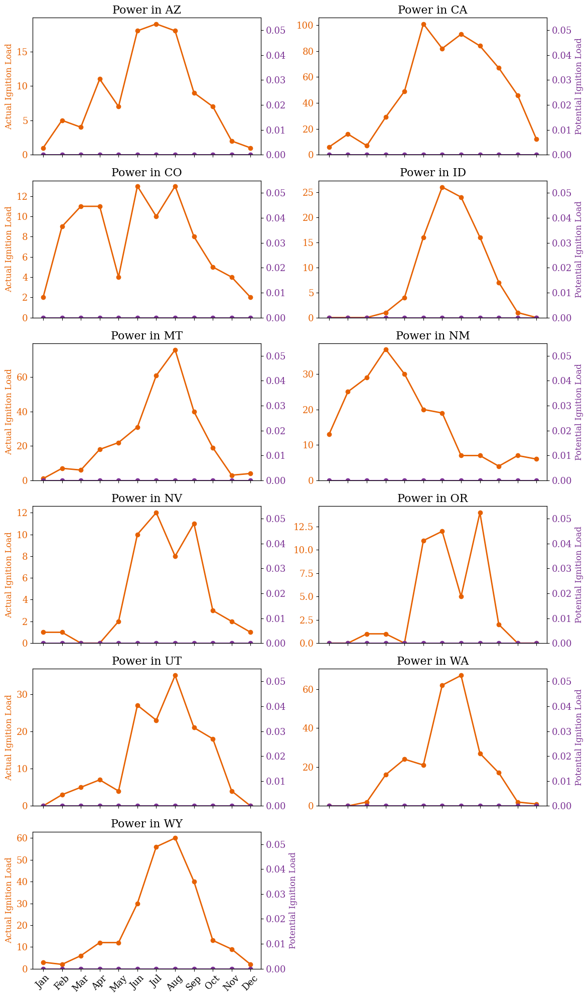

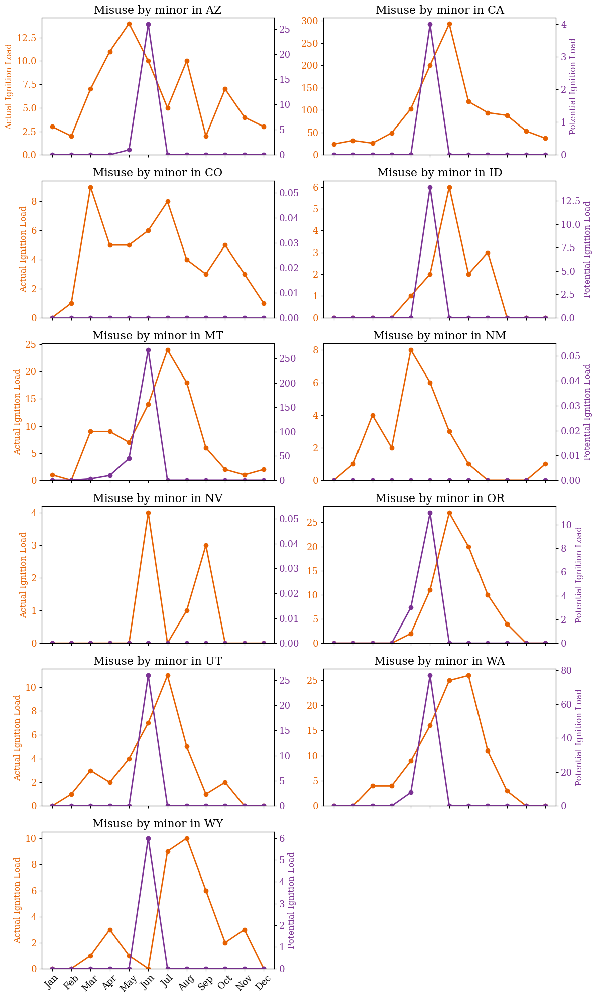

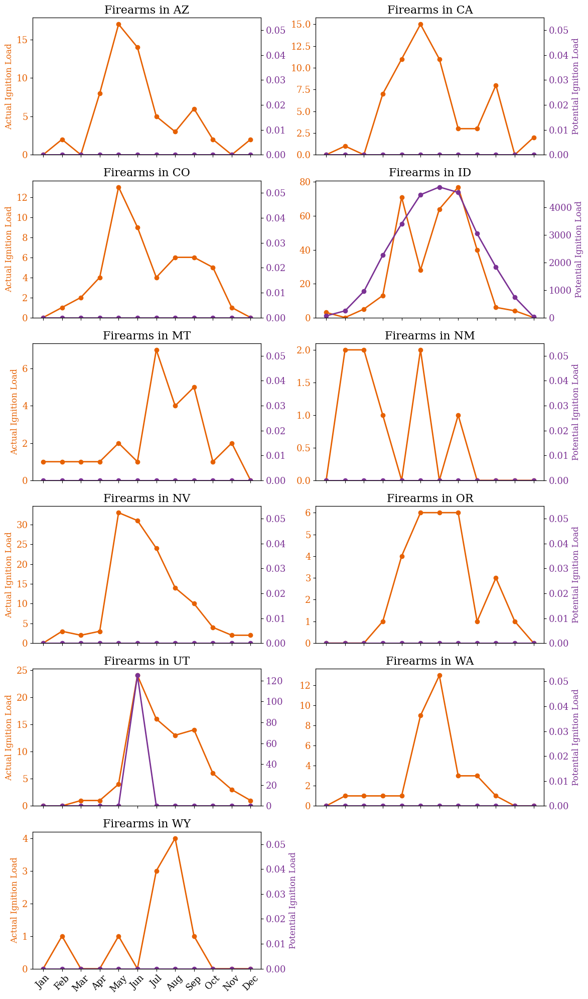

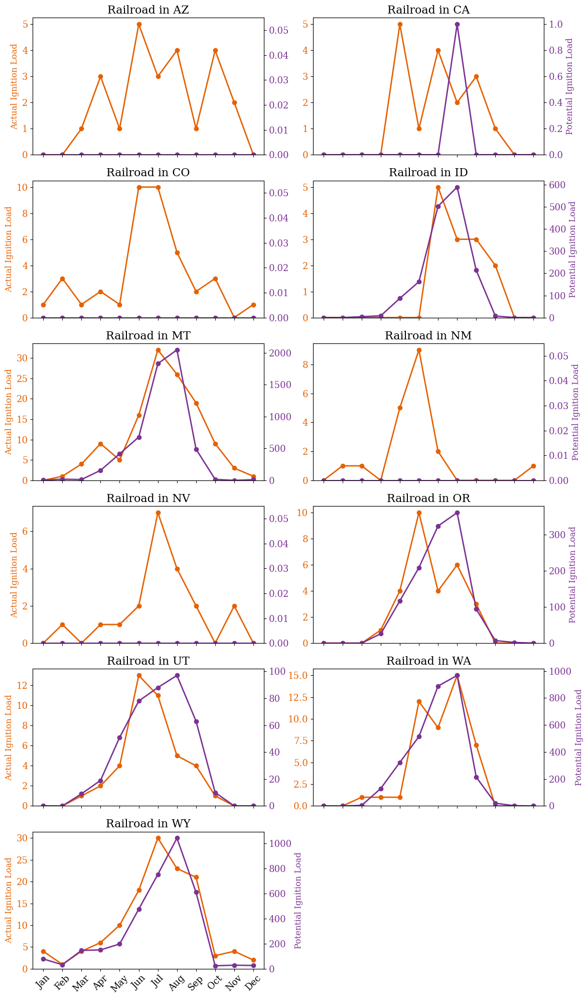

In [23]:
month_ingi_load = ingi_load.groupby(by=['STATE', 'month', 'NWCG_GENERAL_CAUSE'])['Counts'].sum().reset_index()
month_pot_igni_load = pot_igni_load.groupby(by=['STATE', 'month', 'NWCG_GENERAL_CAUSE'])['Counts'].sum().reset_index()
for cause in causes[:]:
    fig, axes = plt.subplots(nrows=6, ncols=2, sharex=True, sharey=False, figsize=(12, 20))
    ax = axes.flatten()
    for i, st in enumerate(sts[:]):
        date_series = month_pot_igni_load.loc[(month_pot_igni_load['STATE'] == st) & (month_pot_igni_load['NWCG_GENERAL_CAUSE'] == cause), 'month']
        actual = month_ingi_load.loc[(month_ingi_load['STATE'] == st) & (month_ingi_load['NWCG_GENERAL_CAUSE'] == cause), 'Counts']
        potential = month_pot_igni_load.loc[(month_pot_igni_load['STATE'] == st) & (month_pot_igni_load['NWCG_GENERAL_CAUSE'] == cause), 'Counts']

        ax[i].plot(date_series, actual, label='Ignition Load', color=actual_color, linewidth=2, marker='o')
        ax[i].set_ylabel('Actual Ignition Load', color=actual_color, fontsize=12)
        ax[i].tick_params(axis='y', labelcolor=actual_color)

        ax2 = ax[i].twinx()
        ax2.plot(date_series, potential, label='Potential Ignition Load', color=potential_color, linewidth=2, marker='o')
        ax2.set_ylabel('Potential Ignition Load', color=potential_color, fontsize=12)
        ax2.tick_params(axis='y', labelcolor=potential_color)
        ax[i].set_ylim(bottom=0)
        ax2.set_ylim(bottom=0)

        
        if i % 2 == 1:
            ax[i].set_ylabel('')
        else:
            ax2.set_ylabel('')
        
        if i == 10:
            ax2.set_ylabel('Potential Ignition Load', color=potential_color, fontsize=12)
        ax2.tick_params(axis = 'both', labelsize = 13)
        ax[i].tick_params(axis = 'both', labelsize = 13)
        ax[i].tick_params(axis = 'x', rotation = 45)
        ax[i].set_title(f'{cause} in {st}', fontsize=16)
        ax[i].set_xlabel('')
        ax[-1].axis('off')
    plt.tight_layout()
    plt.show()

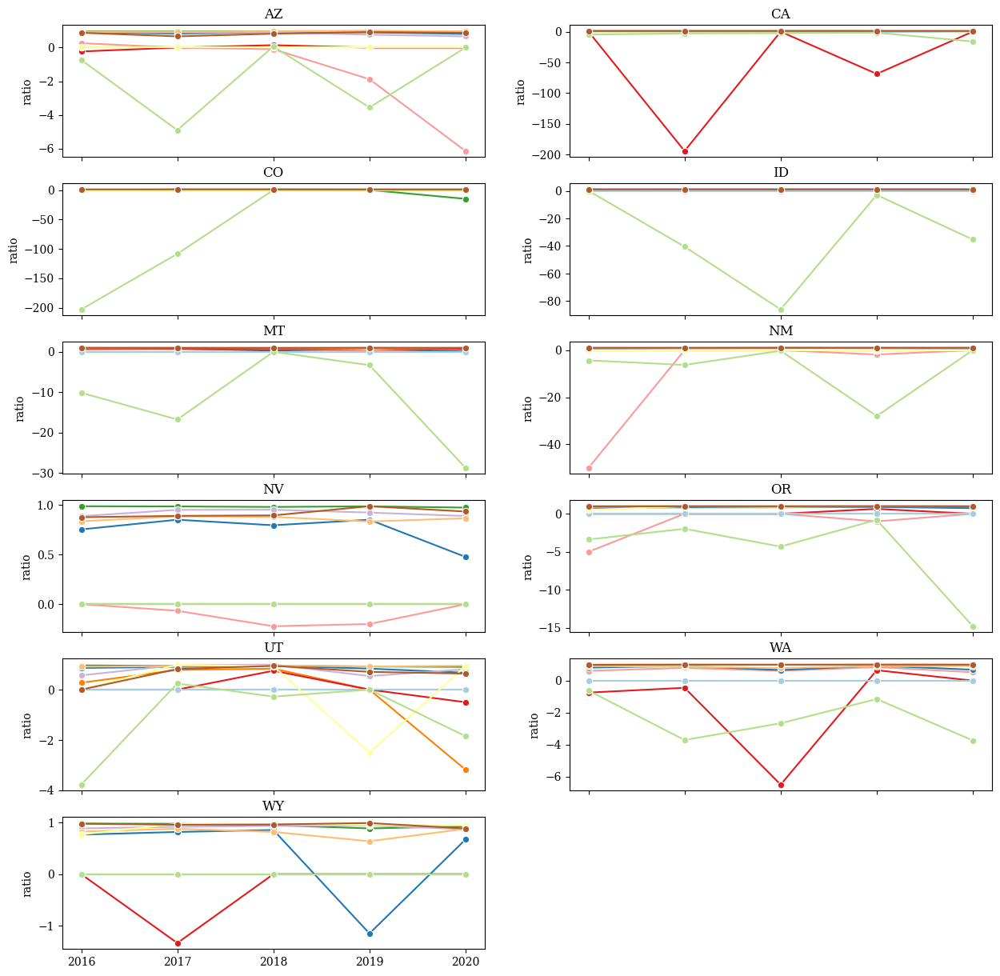

In [11]:
fig, axes = plt.subplots(nrows=6, ncols=2, sharex=True, sharey=False, figsize=(15, 15))
ax = axes.flatten()
for i, st in enumerate(sts):
    sns.lineplot(data=total[total['STATE'] == st],
                 x='FIRE_YEAR',
                 y='ratio',
                 marker='o',
                 hue='NWCG_GENERAL_CAUSE',
                 palette=newCmapp,
                 legend=False, ax=ax[i])
    ax[i].set_title(st)
    ax[i].set_xticks([2016, 2017, 2018, 2019, 2020])
    ax[i].set_xlabel('')
    ax[-1].axis('off')

## Scatter plots

In [139]:
plt_df = ingi_load.copy(deep=True)
for cause in causes:
    actual = plt_df[plt_df['NWCG_GENERAL_CAUSE'] == cause]
    potential = pot_igni_load[pot_igni_load['NWCG_GENERAL_CAUSE'] == cause]

    act_min = actual['Counts'].min()
    act_max = actual['Counts'].max()
    pot_min = potential['Counts'].min()
    pot_max = potential['Counts'].max()

    actual['ratio'] = actual['Counts'] * 100 / (act_max - act_min)
    potential['ratio'] = potential['Counts'] * 100 / (pot_max - pot_min)

    plt_df.loc[actual.index, 'Actual ratio'] = actual['ratio']
    plt_df.loc[actual.index, 'Potential ratio'] = potential['ratio']

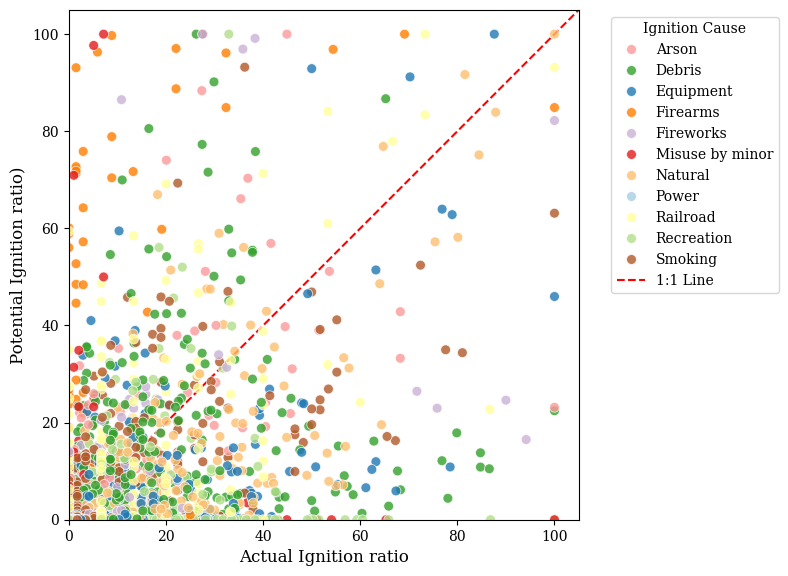

In [144]:
fig, ax = plt.subplots(figsize=(8, 8))
# Use Seaborn's scatterplot with 'hue' for color-coding the Ignition Cause
sns.scatterplot(data=plt_df,
                x='Actual ratio',
                y='Potential ratio',
                hue='NWCG_GENERAL_CAUSE',  # Color-code by cause
                s=50,                 # Marker size
                alpha=0.8,
                ax=ax,
                palette=newCmapp
                )

min_val = min(plt_df['Actual ratio'].min(), plt_df['Potential ratio'].min()) * 0.95
max_val = max(plt_df['Actual ratio'].max(), plt_df['Potential ratio'].max()) * 1.05

ax.plot([min_val, max_val], [min_val, max_val],
        color='red', linestyle='--', linewidth=1.5,
        label='1:1 Line',
        zorder=0)  # Put the line behind the data points

ax.set_xlabel('Actual Ignition ratio', fontsize=12)
ax.set_ylabel('Potential Ignition ratio)', fontsize=12)

ax.set_aspect('equal', adjustable='box')
ax.set_xlim(min_val, max_val)
ax.set_ylim(min_val, max_val)

ax.legend(title='Ignition Cause', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()